In [1]:
pip install folium

Note: you may need to restart the kernel to use updated packages.


    extract-msg (<=0.29.*)
                 ~~~~~~~^


In [2]:
pip install sqlalchemy

Note: you may need to restart the kernel to use updated packages.


    extract-msg (<=0.29.*)
                 ~~~~~~~^


In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import HeatMap
from sqlalchemy import create_engine

In [4]:
crimeData = pd.read_csv('mergedCrime-1.csv')
crimeData.head()

,OBJECTID,EVENT_UNIQUE_ID,OCC_DATE,OCC_YEAR,OCC_MONTH,OCC_DAY,OCC_DOW,OCC_DOY,OFFENCE,MCI_CATEGORY,OCC_HOUR,LONG_WGS84,LAT_WGS84,HOOD_158,NEIGHBOURHOOD_158,OCC_TIME_RANGE
0,1,GO-2004111878,1/3/2004 5:00:00 AM,2004.0,January,3.0,Saturday,3.0,Other,Homicide,NaN,-79.392828,43.685026,098,Rosedale-Moore Park (98),NaN
1,2,GO-2004125755,1/8/2004 5:00:00 AM,2004.0,January,8.0,Thursday,8.0,Shooting,Homicide,8.0,-79.233852,43.781782,142,Woburn North (142),Morning
2,3,GO-2004136086,1/8/2004 5:00:00 AM,2004.0,January,8.0,Thursday,8.0,Shooting,Homicide,14.0,-79.205574,43.810544,146,Malvern East (146),Afternoon
3,4,GO-2004148623,1/25/2004 5:00:00 AM,2004.0,January,25.0,Sunday,25.0,Shooting,Homicide,4.0,-79.434387,43.670467,171,Junction-Wallace Emerson (171),Morning
4,5,GO-2004148619,1/25/2004 5:00:00 AM,2004.0,January,25.0,Sunday,25.0,Shooting,Homicide,0.0,-79.204958,43.822997,144,Morningside Heights (144),Night


In [5]:
# Remove duplicated records based on unique event ID
duplicated_records = crimeData[crimeData.duplicated(subset=['EVENT_UNIQUE_ID'], keep=False)]
duplicated_records

,OBJECTID,EVENT_UNIQUE_ID,OCC_DATE,OCC_YEAR,OCC_MONTH,OCC_DAY,OCC_DOW,OCC_DOY,OFFENCE,MCI_CATEGORY,OCC_HOUR,LONG_WGS84,LAT_WGS84,HOOD_158,NEIGHBOURHOOD_158,OCC_TIME_RANGE


In [6]:
# Filter records later than 2018
crimeDf = crimeData[crimeData["OCC_YEAR"] >= 2018]

In [7]:
crimeData.head()

,OBJECTID,EVENT_UNIQUE_ID,OCC_DATE,OCC_YEAR,OCC_MONTH,OCC_DAY,OCC_DOW,OCC_DOY,OFFENCE,MCI_CATEGORY,OCC_HOUR,LONG_WGS84,LAT_WGS84,HOOD_158,NEIGHBOURHOOD_158,OCC_TIME_RANGE
0,1,GO-2004111878,1/3/2004 5:00:00 AM,2004.0,January,3.0,Saturday,3.0,Other,Homicide,NaN,-79.392828,43.685026,098,Rosedale-Moore Park (98),NaN
1,2,GO-2004125755,1/8/2004 5:00:00 AM,2004.0,January,8.0,Thursday,8.0,Shooting,Homicide,8.0,-79.233852,43.781782,142,Woburn North (142),Morning
2,3,GO-2004136086,1/8/2004 5:00:00 AM,2004.0,January,8.0,Thursday,8.0,Shooting,Homicide,14.0,-79.205574,43.810544,146,Malvern East (146),Afternoon
3,4,GO-2004148623,1/25/2004 5:00:00 AM,2004.0,January,25.0,Sunday,25.0,Shooting,Homicide,4.0,-79.434387,43.670467,171,Junction-Wallace Emerson (171),Morning
4,5,GO-2004148619,1/25/2004 5:00:00 AM,2004.0,January,25.0,Sunday,25.0,Shooting,Homicide,0.0,-79.204958,43.822997,144,Morningside Heights (144),Night


In [8]:
# Remove duplicated records based on unique event ID
duplicated_records = crimeData[crimeData.duplicated(subset=['EVENT_UNIQUE_ID'], keep=False)]
duplicated_records

,OBJECTID,EVENT_UNIQUE_ID,OCC_DATE,OCC_YEAR,OCC_MONTH,OCC_DAY,OCC_DOW,OCC_DOY,OFFENCE,MCI_CATEGORY,OCC_HOUR,LONG_WGS84,LAT_WGS84,HOOD_158,NEIGHBOURHOOD_158,OCC_TIME_RANGE


In [9]:
# Filter records later than 2018
crimeDf = crimeData[crimeData["OCC_YEAR"] >= 2018]
crimeDf.head()

,OBJECTID,EVENT_UNIQUE_ID,OCC_DATE,OCC_YEAR,OCC_MONTH,OCC_DAY,OCC_DOW,OCC_DOY,OFFENCE,MCI_CATEGORY,OCC_HOUR,LONG_WGS84,LAT_WGS84,HOOD_158,NEIGHBOURHOOD_158,OCC_TIME_RANGE
858,920,GO-201817532,1/3/2018 5:00:00 AM,2018.0,January,3.0,Wednesday,3.0,Other,Homicide,NaN,-79.563174,43.681502,007,Willowridge-Martingrove-Richview (7),NaN
859,921,GO-201854152,1/9/2018 5:00:00 AM,2018.0,January,9.0,Tuesday,9.0,Shooting,Homicide,20.0,-79.517334,43.694614,008,Humber Heights-Westmount (8),Evening
860,922,GO-2018113424,1/19/2018 5:00:00 AM,2018.0,January,19.0,Friday,19.0,Shooting,Homicide,0.0,-79.569103,43.659231,011,Eringate-Centennial-West Deane (11),Night
861,924,GO-2018183793,1/29/2018 5:00:00 AM,2018.0,January,29.0,Monday,29.0,Stabbing,Homicide,NaN,-79.384563,43.664920,167,Church-Wellesley (167),NaN
862,925,GO-2018249547,2/8/2018 5:00:00 AM,2018.0,February,8.0,Thursday,39.0,Shooting,Homicide,23.0,-79.387403,43.780730,052,Bayview Village (52),Night


In [10]:
crimeDf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 228458 entries, 858 to 349473
Data columns (total 16 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   OBJECTID           228458 non-null  int64  
 1   EVENT_UNIQUE_ID    228458 non-null  object 
 2   OCC_DATE           228458 non-null  object 
 3   OCC_YEAR           228458 non-null  float64
 4   OCC_MONTH          228458 non-null  object 
 5   OCC_DAY            228458 non-null  float64
 6   OCC_DOW            228458 non-null  object 
 7   OCC_DOY            228458 non-null  float64
 8   OFFENCE            228458 non-null  object 
 9   MCI_CATEGORY       228458 non-null  object 
 10  OCC_HOUR           228232 non-null  float64
 11  LONG_WGS84         228458 non-null  float64
 12  LAT_WGS84          228458 non-null  float64
 13  HOOD_158           228458 non-null  object 
 14  NEIGHBOURHOOD_158  228458 non-null  object 
 15  OCC_TIME_RANGE     228232 non-null  object 
dtype

In [11]:
crimeDf.describe()

,OBJECTID,OCC_YEAR,OCC_DAY,OCC_DOY,OCC_HOUR,LONG_WGS84,LAT_WGS84
count,228458.000000,228458.000000,228458.000000,228458.000000,228232.000000,228458.000000,228458.000000
mean,262639.911038,2020.921185,15.472599,178.273354,12.539057,-78.181198,43.034456
std,80908.304204,1.931992,8.898976,104.432850,7.290003,9.765091,5.375112
min,920.000000,2018.000000,1.000000,1.000000,0.000000,-79.639247,0.000000
25%,197879.250000,2019.000000,8.000000,89.000000,6.000000,-79.475283,43.658981
50%,264508.500000,2021.000000,15.000000,174.000000,14.000000,-79.396263,43.698236
75%,330890.750000,2023.000000,23.000000,268.000000,19.000000,-79.328577,43.749402
max,396735.000000,2024.000000,31.000000,366.000000,23.000000,0.000000,43.853164


In [12]:
# Create a SQL database engine for querying (SQLite for demonstration)
engine = create_engine('sqlite://', echo=False)

In [13]:
# Load the data into a SQL table
crimeDf.to_sql('crime_data', con=engine, if_exists='replace', index=False)

228458

In [14]:
# Count crimes by each MCI_CATEGORY
sql_query = "SELECT MCI_CATEGORY, COUNT(*) AS count FROM crime_data GROUP BY MCI_CATEGORY ORDER BY count DESC;"
mci_category_counts = pd.read_sql(sql_query, con=engine)
print(mci_category_counts)

      MCI_CATEGORY   count
0          Assault  115068
1  Break and Enter   44785
2       Auto Theft   44211
3          Robbery   15332
4       Theft Over    8574
5         Homicide     488


In [15]:
# Find the neighborhood with the most crimes
sql_query = """
SELECT NEIGHBOURHOOD_158, COUNT(*) AS crime_count 
FROM crime_data 
GROUP BY NEIGHBOURHOOD_158 
ORDER BY crime_count DESC 
LIMIT 10;
"""
top_neighborhoods = pd.read_sql(sql_query, con=engine)
print(top_neighborhoods)

              NEIGHBOURHOOD_158  crime_count
0    West Humber-Clairville (1)         6610
1                Moss Park (73)         5390
2     Downtown Yonge East (168)         4868
3  York University Heights (27)         4366
4     Kensington-Chinatown (78)         4181
5      Yonge-Bay Corridor (170)         4147
6        Wellington Place (164)         3783
7                    Annex (95)         3725
8                           NSA         3662
9               West Hill (136)         3186


In [16]:
# Count crimes by OCC_TIME_RANGE
sql_query = """
SELECT OCC_TIME_RANGE, MCI_CATEGORY, COUNT(*) AS count 
FROM crime_data 
GROUP BY OCC_TIME_RANGE, MCI_CATEGORY
ORDER BY count DESC;
"""
time_range_crimes = pd.read_sql(sql_query, con=engine)
print(time_range_crimes)

   OCC_TIME_RANGE     MCI_CATEGORY  count
0           Night          Assault  35576
1       Afternoon          Assault  30287
2         Evening          Assault  24766
3         Morning          Assault  24439
4           Night       Auto Theft  18340
5           Night  Break and Enter  16702
6         Morning  Break and Enter  13767
7         Evening       Auto Theft  10775
8         Morning       Auto Theft   8048
9       Afternoon  Break and Enter   7547
10      Afternoon       Auto Theft   7048
11        Evening  Break and Enter   6769
12          Night          Robbery   5226
13        Evening          Robbery   3941
14      Afternoon          Robbery   3777
15      Afternoon       Theft Over   2523
16        Morning          Robbery   2388
17          Night       Theft Over   2378
18        Evening       Theft Over   1894
19        Morning       Theft Over   1779
20           None         Homicide    226
21          Night         Homicide    136
22        Evening         Homicide

In [17]:
# Filter for valid latitude and longitude, drop missing values
df = crimeDf.dropna(subset=['LAT_WGS84', 'LONG_WGS84'])

#lat, lng to list of tuples
crime_locations = df[['LAT_WGS84', 'LONG_WGS84']].values.tolist()

# give lat and lng for toronto
toronto_map = folium.Map(location=[43.7, -79.42], zoom_start=11)

# Add the heatmap to toronto map
HeatMap(crime_locations,radius=10).add_to(toronto_map)

# Display the map
toronto_map

In [18]:
crimeDf["MCI_CATEGORY"].unique()

array(['Homicide', 'Assault', 'Robbery', 'Auto Theft', 'Break and Enter',
       'Theft Over'], dtype=object)

In [19]:
# Fiter for "Homicide" major crime indicator
filtered_df = crimeDf[crimeDf['MCI_CATEGORY'] == 'Homicide']

crime_locations = filtered_df[['LAT_WGS84', 'LONG_WGS84']].values.tolist()

# Give lat lng for toronto
toronto_map = folium.Map(location=[43.7, -79.42], zoom_start=11)

# Add the heatmap 
HeatMap(crime_locations,radius=15).add_to(toronto_map)

toronto_map

In [20]:
# Filter for "Assault"
filtered_df = crimeDf[crimeDf['MCI_CATEGORY'] == 'Assault']

crime_locations = filtered_df[['LAT_WGS84', 'LONG_WGS84']].values.tolist()
toronto_map = folium.Map(location=[43.7, -79.42], zoom_start=11)
HeatMap(crime_locations,radius=15).add_to(toronto_map)
toronto_map

In [21]:
# Filter for "Robbery"
filtered_df = crimeDf[crimeDf['MCI_CATEGORY'] == "Robbery"]
crime_locations = filtered_df[['LAT_WGS84', 'LONG_WGS84']].values.tolist()
toronto_map = folium.Map(location=[43.7, -79.42], zoom_start=11)
HeatMap(crime_locations,radius=10).add_to(toronto_map)

toronto_map

In [22]:
# Filter for "AutoTheft"
filtered_df = crimeDf[crimeDf['MCI_CATEGORY'] == "Auto Theft"]

crime_locations = filtered_df[['LAT_WGS84', 'LONG_WGS84']].values.tolist()

toronto_map = folium.Map(location=[43.7, -79.42], zoom_start=11)

HeatMap(crime_locations,radius=5).add_to(toronto_map)
toronto_map

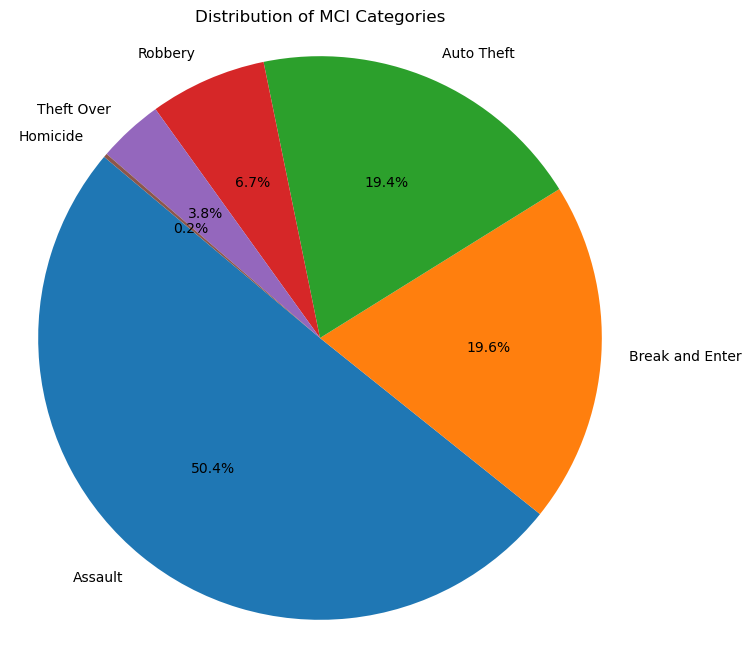

In [23]:
# Data visualization: Distribution of MCI Categories
mci_counts = crimeDf['MCI_CATEGORY'].value_counts()
plt.figure(figsize=(8, 8))
plt.pie(mci_counts, labels=mci_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Distribution of MCI Categories')
plt.axis('equal')
plt.show()

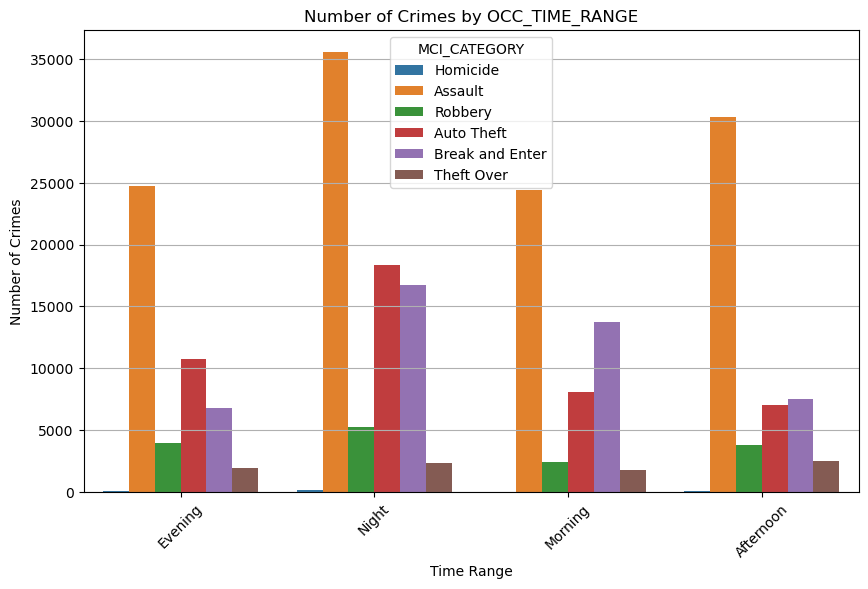

In [24]:
# Crime count by time range
plt.figure(figsize=(10, 6))
sns.countplot(data=crimeDf, x='OCC_TIME_RANGE', hue='MCI_CATEGORY')
plt.title('Number of Crimes by OCC_TIME_RANGE')
plt.xlabel('Time Range')
plt.ylabel('Number of Crimes')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

C:\Users\Hetal\AppData\Local\Temp\ipykernel_22180\1161551653.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  crimeDf["OCC_DOW"] = crimeDf["OCC_DOW"].apply(lambda x: x.strip())


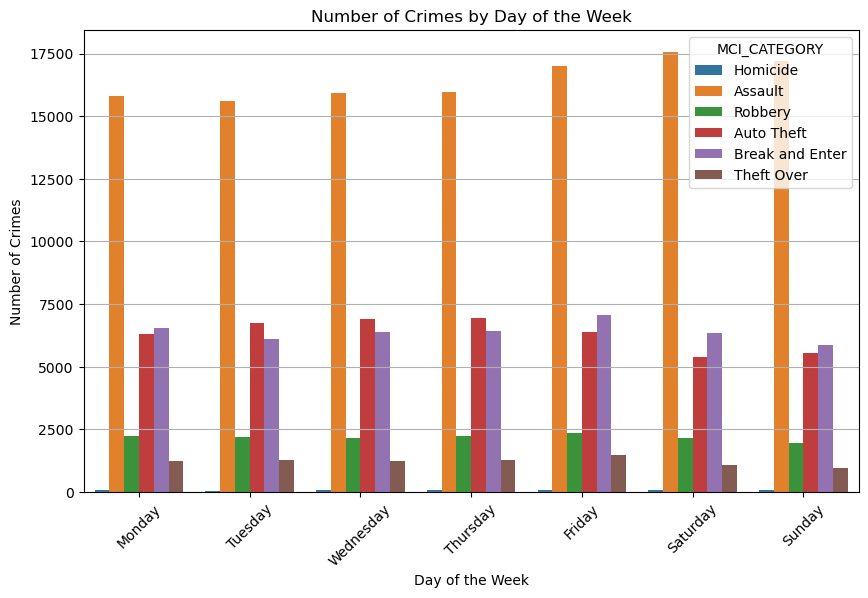

In [25]:
# Crime by day of the week
crimeDf["OCC_DOW"] = crimeDf["OCC_DOW"].apply(lambda x: x.strip())
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
plt.figure(figsize=(10, 6))
sns.countplot(data=crimeDf, x='OCC_DOW', order=day_order, hue='MCI_CATEGORY')
plt.title('Number of Crimes by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Number of Crimes')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

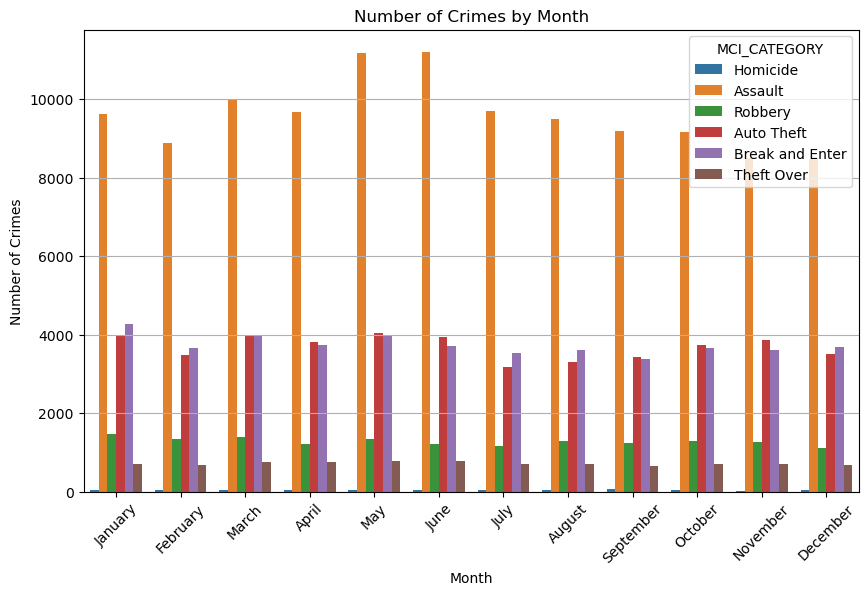

In [26]:
# Crime count by month
plt.figure(figsize=(10, 6))
sns.countplot(data=crimeDf, x='OCC_MONTH', hue='MCI_CATEGORY')
plt.title('Number of Crimes by Month')
plt.xlabel('Month')
plt.ylabel('Number of Crimes')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

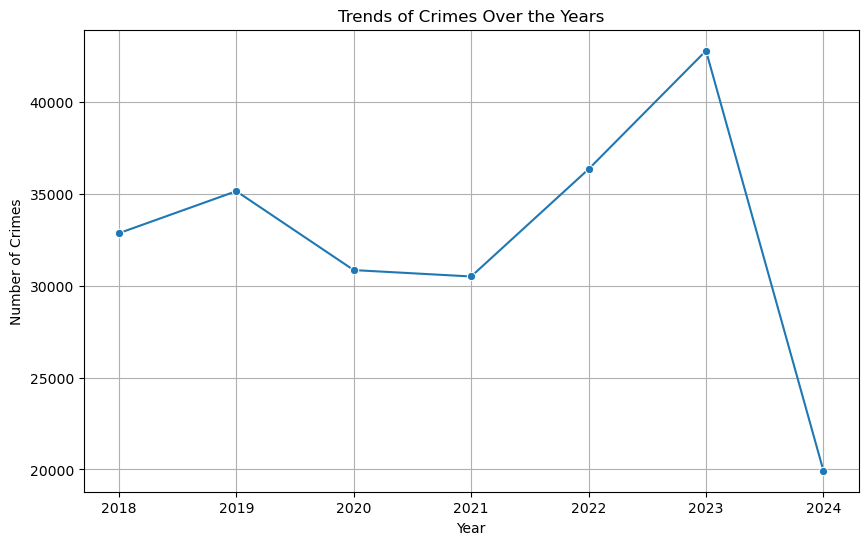

In [27]:
# Trends of crimes over the years
yearly_crime_counts = crimeDf['OCC_YEAR'].value_counts().sort_index()
plt.figure(figsize=(10, 6))
sns.lineplot(data=yearly_crime_counts, marker='o')
plt.title('Trends of Crimes Over the Years')
plt.xlabel('Year')
plt.ylabel('Number of Crimes')
plt.xticks(yearly_crime_counts.index)
plt.grid()
plt.show()

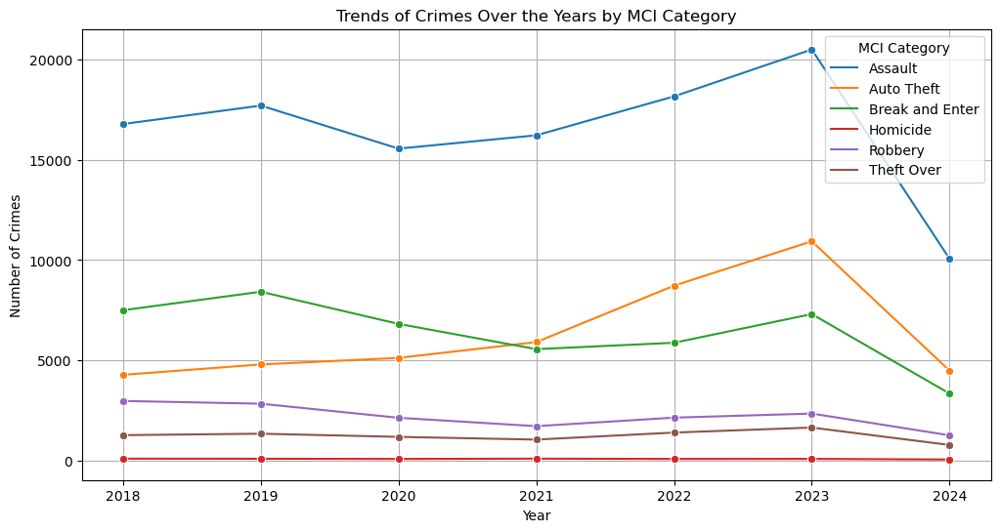

In [28]:
# Crime trends by MCI category over the years
yearly_crime_counts = crimeDf.groupby(['OCC_YEAR', 'MCI_CATEGORY']).size().reset_index(name='Count')
plt.figure(figsize=(12, 6))
sns.lineplot(data=yearly_crime_counts, x='OCC_YEAR', y='Count', hue='MCI_CATEGORY', marker='o')
plt.title('Trends of Crimes Over the Years by MCI Category')
plt.xlabel('Year')
plt.ylabel('Number of Crimes')
plt.grid()
plt.legend(title='MCI Category')
plt.show()

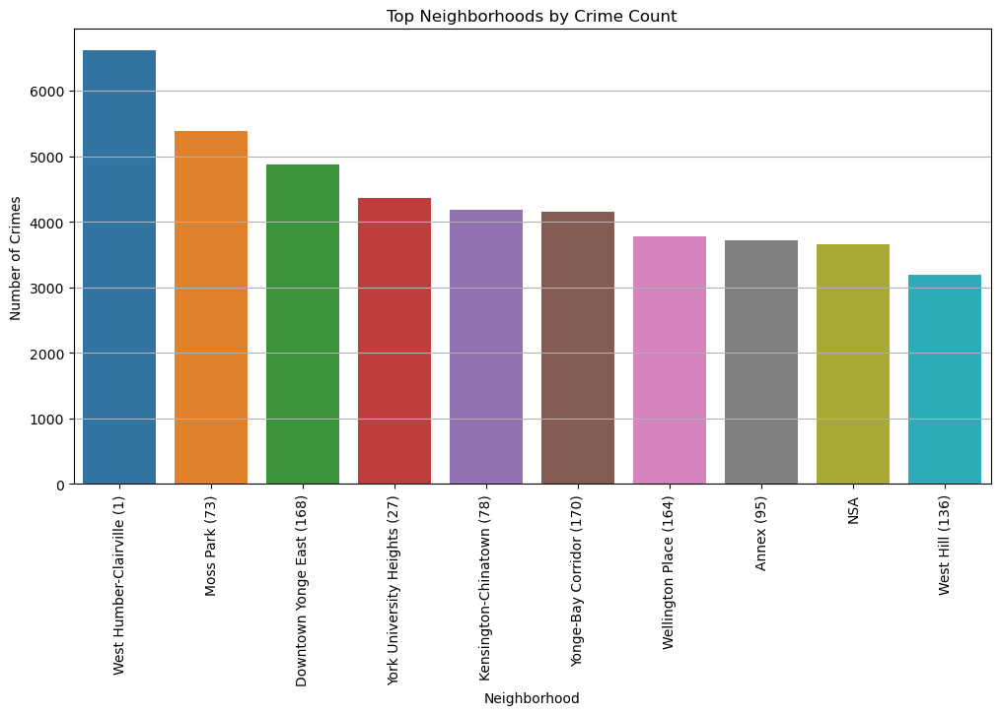

In [29]:
# Top neighborhoods by crime count
plt.figure(figsize=(12, 6))
sns.barplot(x=top_neighborhoods['NEIGHBOURHOOD_158'], y=top_neighborhoods['crime_count'])
plt.title('Top Neighborhoods by Crime Count')
plt.xlabel('Neighborhood')
plt.ylabel('Number of Crimes')
plt.xticks(rotation=90)
plt.grid(axis='y')
plt.show()

In [30]:
# Impute missing OCC_HOUR values based on mode by month for Homicide
mode_by_month = crimeDf[crimeDf['MCI_CATEGORY'] == 'Homicide'].groupby('OCC_MONTH')['OCC_HOUR'].agg(lambda x: x.mode()[0] if not x.mode().empty else None)
mode_mapping = mode_by_month.to_dict()

In [31]:
def impute_hour(row):
    if pd.isna(row['OCC_HOUR']):
        return mode_mapping.get(row['OCC_MONTH'], None)
    return row['OCC_HOUR']

crimeDf['OCC_HOUR'] = crimeDf.apply(impute_hour, axis=1)

C:\Users\Hetal\AppData\Local\Temp\ipykernel_22180\2956756567.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  crimeDf['OCC_HOUR'] = crimeDf.apply(impute_hour, axis=1)


In [32]:
# Categorize crime occurrences by time range
def categorize_time(hour):
    if pd.isna(hour):
        return np.nan
    elif 21 <= hour < 24 or 0 <= hour < 4:
        return 'Night'
    elif 4 <= hour < 12:
        return 'Morning'
    elif 12 <= hour < 17:
        return 'Afternoon'
    else:
        return 'Evening'

crimeDf['OCC_TIME_RANGE'] = crimeDf['OCC_HOUR'].apply(categorize_time)

# Check for missing values
crimeDf.isnull().sum()

C:\Users\Hetal\AppData\Local\Temp\ipykernel_22180\2977500118.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  crimeDf['OCC_TIME_RANGE'] = crimeDf['OCC_HOUR'].apply(categorize_time)


OBJECTID             0
EVENT_UNIQUE_ID      0
OCC_DATE             0
OCC_YEAR             0
OCC_MONTH            0
OCC_DAY              0
OCC_DOW              0
OCC_DOY              0
OFFENCE              0
MCI_CATEGORY         0
OCC_HOUR             0
LONG_WGS84           0
LAT_WGS84            0
HOOD_158             0
NEIGHBOURHOOD_158    0
OCC_TIME_RANGE       0
dtype: int64